In [1]:
from google.colab import drive
drive.mount("/content/drive",force_remount=True)

Mounted at /content/drive


In [2]:
from google.colab import files
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [5]:
%cd "/content/drive/MyDrive/OS/Assignment2/src"

/content/drive/MyDrive/OS/Assignment2/src


# Assignment 2

# Question 1

In [6]:
# execute if the current directory is src
%cd "../"

/content/drive/MyDrive/OS/Assignment2


## A  -  Seam Carving function

In [7]:
from math import sqrt

import timeit
from numba import jit
from numba import prange


In [8]:
# step 1 -  seam energy
@jit(nopython=True)
def seam_energy(image):
  (h,w,d) = image.shape
  image_se = np.zeros((h,w))
  for i in range(0,h):
    for j in range(0,w):
      for k in range(0,d):
        if (i!=0):
            image_se[i,j] += (image[i,j,k]-image[i-1,j,k])*(image[i,j,k]-image[i-1,j,k])
        else:
            image_se[i,j] += image[i,j,k]*image[i,j,k]
        if (j!=0):
            image_se[i,j] += (image[i,j,k]-image[i,j-1,k])*(image[i,j,k]-image[i,j-1,k])
        else:
            image_se[i,j] += image[i,j,k]*image[i,j,k]
        if (i!=h-1):
            image_se[i,j] += (image[i,j,k]-image[i+1,j,k])*(image[i,j,k]-image[i+1,j,k])
        else:
            image_se[i,j] += image[i,j,k]*image[i,j,k]
        if (j!=w-1):
            image_se[i,j] += (image[i,j,k]-image[i,j+1,k])*(image[i,j,k]-image[i,j+1,k])
        else:
            image_se[i,j] += image[i,j,k]*image[i,j,k]
  return image_se 

In [9]:
# step 2 -  seam identification 
@jit(nopython=True)
def seam_identification(a):
  (h,w) = a.shape
  dp = np.zeros((h,w,2))
  for i in range(h-1,-1,-1):
    for j in range(0,w):
      if (i==h-1):
        dp[i,j,0] = a[i,j]
        dp[i,j,1] = -1
      else:
        l = [10**9 if (j==0) else dp[i+1,j-1][0], dp[i+1,j][0], 10**9 if (j+1 == w) else dp[i+1,j+1][0] ]
        
        dp[i,j,0] = (min(l) + a[i,j])
        dp[i,j,1] = j + l.index(min(l)) - 1
  return dp

In [10]:
# step 3 - Seam Removal
@jit(nopython=True)
def seam_removal(image, dp):
  (h,w,d) = dp.shape
  ind = list(dp[0,:,0]).index(min(list(dp[0,:,0])))
  check_px = np.ones((h,w))
  image_new = np.zeros((h,w-1,3))
  i = 0
  while (i<h):
    ind = int(ind)
    check_px[i,ind] = 0
    ind = dp[i,ind,1]
    i+=1
  # new image
  # col = 0     # tracks the current index of old pixel
  # im2 = image.copy()
  for i in range(0,h):
    col = 0
    for j in range(0,w-1):
      if (check_px[i,col] == 0):
          # im2[i,max(0,col-5):min(w-1,col+5)] = (255,0,0)
          col += 1
      image_new[i,j,0] = image[i,col,0]
      image_new[i,j,1] = image[i,col,1]
      image_new[i,j,2] = image[i,col,2]
      col += 1
  # cv2_imshow(im2)
  return image_new

In [11]:
# @jit
def seam_carving(image, number):
  for i in range(0,number):
    image = np.array(image)       # 'uint8' to 'int'
    # step 1 -  seam energy
    image_se = seam_energy(image) 
    
    # step 2 - seam identification
    dp  = seam_identification(image_se)

    # step 3 - Seam removal
    resized_image = seam_removal(image, dp) 
    image = resized_image
  return image

###  Vertical seaming

In [ ]:
# @jit(nopython=True,)
imgs = [cv2.imread("./images/bangalore-dancers.jpg"),cv2.imread("./images/cat.jpg"),cv2.imread("./images/chhota-bheem.jpg"),cv2.imread("./images/trafalgar-square.jpg"),cv2.imread("./images/shadow.jpg"),cv2.imread("./images/uluru.jpg"),cv2.imread("./images/iiit.jpg"),cv2.imread("./images/maldives.jpg"),cv2.imread("./images/tanjore.jpg")]
imgsNames = ["bangalore-dancers","cat","chhota-bheem","trafalgar-square","shadow","uluru","iiit","maldives","tanjore"]
print("image Name \t\t 20% time \t\t40% time\t\t 60% time")
for i in range(0,9): #imgs.shape[0]):
  (h,w,d) = imgs[i].shape
  image = np.array(imgs[i],'int')
  # re_im = seam_carving(image,1)
  print(imgsNames[i],"\t  ",end=" ")
  for j in range(1,4):

    number = round(0.2*j*w)
    start = timeit.default_timer();
    re_im = seam_carving(image,number)
    stop = timeit.default_timer();
    print(stop -start,"\t ",end=" ")
    cv2.imwrite("./src" + str(imgsNames[i]) + "_" + str(j*20)+"%.jpg",re_im) # saves the image in the parent directory of src directory
  print()

image Name 		 20% time 		40% time		 60% time
bangalore-dancers 	   3.5254119290002564 	  6.17186405999928 	  8.121102802999303 	  
cat 	   0.1171253100001195 	  0.21185618599884037 	  0.28519495299951814 	  
chhota-bheem 	   155.74496309700044 	  273.1906896929995 	  358.8321205109987 	  
trafalgar-square 	   1.4617772869987675 	  2.5985176070007583 	  3.38536362800005 	  
shadow 	   2.9486723110003368 	  5.25064035899959 	  6.881426960999306 	  
uluru 	   3.431892839000284 	  6.065487824998854 	  7.947676623000007 	  
iiit 	   10.07809790399915 	  17.952213387001393 	  23.460998776999986 	  
maldives 	   2653.0567122719985 	  4637.960970341001 	  6205.623834553 	  


In [ ]:
##### ---------- Tanjore.jpg --- seam removal -- Forget to run ---

imgs = [cv2.imread("./images/bangalore-dancers.jpg"),cv2.imread("./images/cat.jpg"),cv2.imread("./images/chhota-bheem.jpg"),cv2.imread("./images/trafalgar-square.jpg"),cv2.imread("./images/shadow.jpg"),cv2.imread("./images/uluru.jpg"),cv2.imread("./images/iiit.jpg"),cv2.imread("./images/maldives.jpg"),cv2.imread("./images/tanjore.jpg")]
imgsNames = ["bangalore-dancers","cat","chhota-bheem","trafalgar-square","shadow","uluru","iiit","maldives","tanjore"]
for i in range(8,9): #imgs.shape[0]):
  (h,w,d) = imgs[i].shape
  image = np.array(imgs[i],'int')
  # re_im = seam_carving(image,1)
  print(imgsNames[i],"\t  ",end=" ")
  for j in range(1,4):

    number = round(0.2*j*w)
    start = timeit.default_timer();
    re_im = seam_carving(image,number)
    stop = timeit.default_timer();
    print(stop -start,"\t ",end=" ")
    cv2.imwrite("./src/" +str(imgsNames[i]) + "_" + str(j*20)+"%.jpg",re_im) # saves the image

tanjore 	   10.366248035000126 	  18.36688148500002 	  24.491184246999865 	  

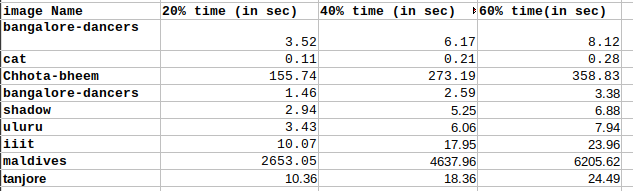

##### images

bangalore-dancers 20% resized


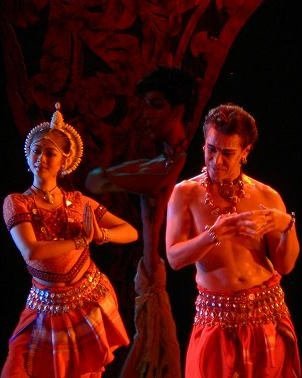

bangalore-dancers 40% resized


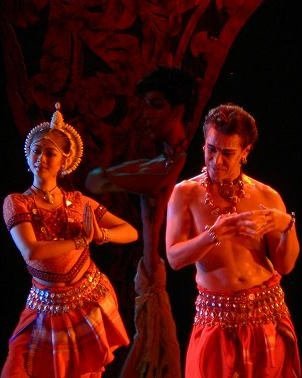

bangalore-dancers 60% resized


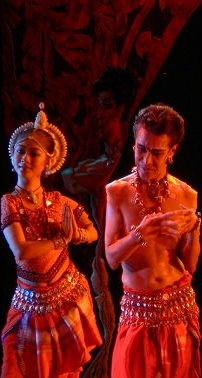

cat 20% resized


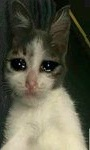

cat 40% resized


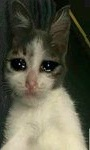

cat 60% resized


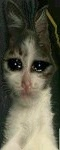

chhota-bheem 20% resized


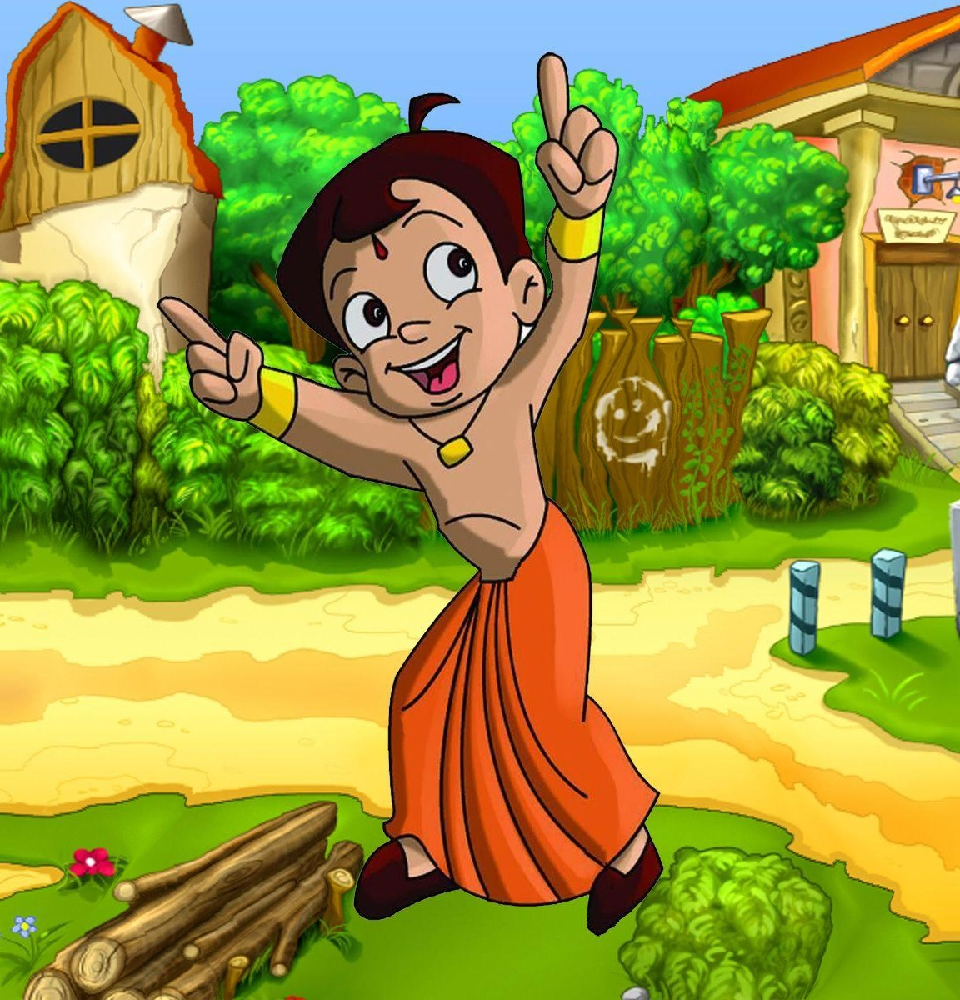

chhota-bheem 40% resized


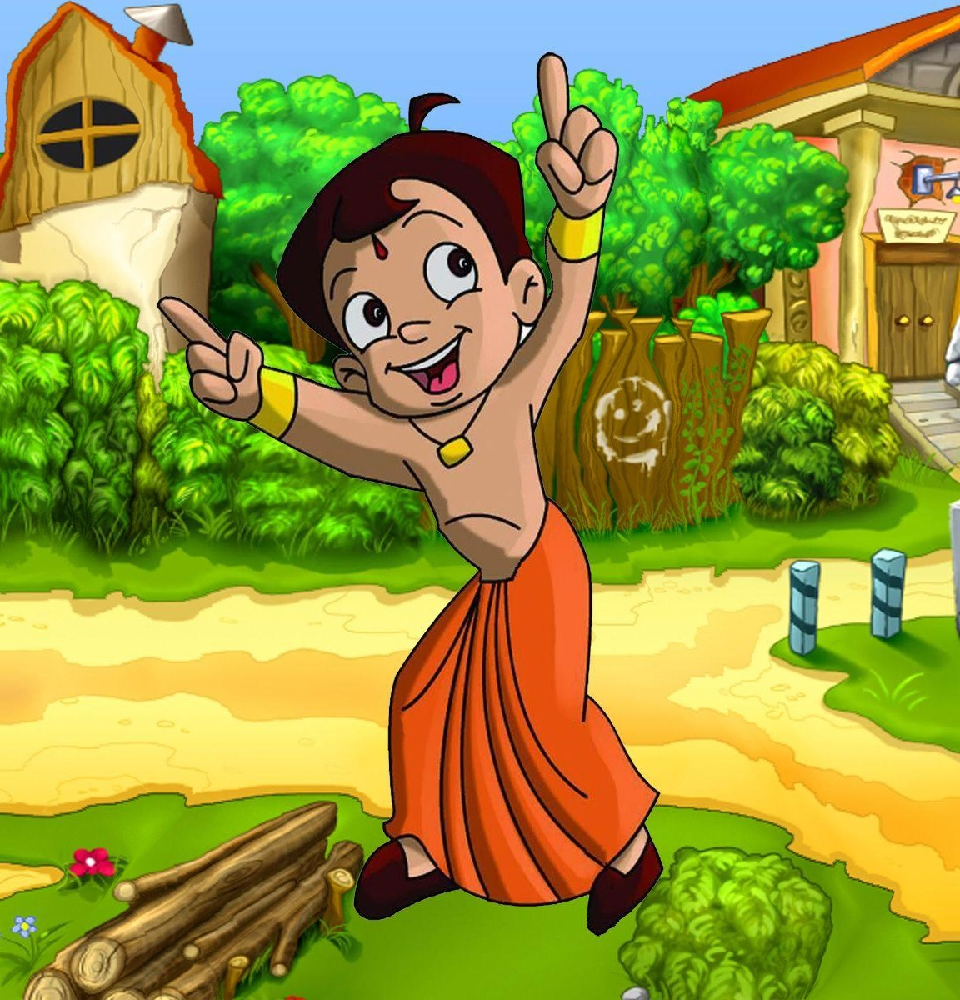

chhota-bheem 60% resized


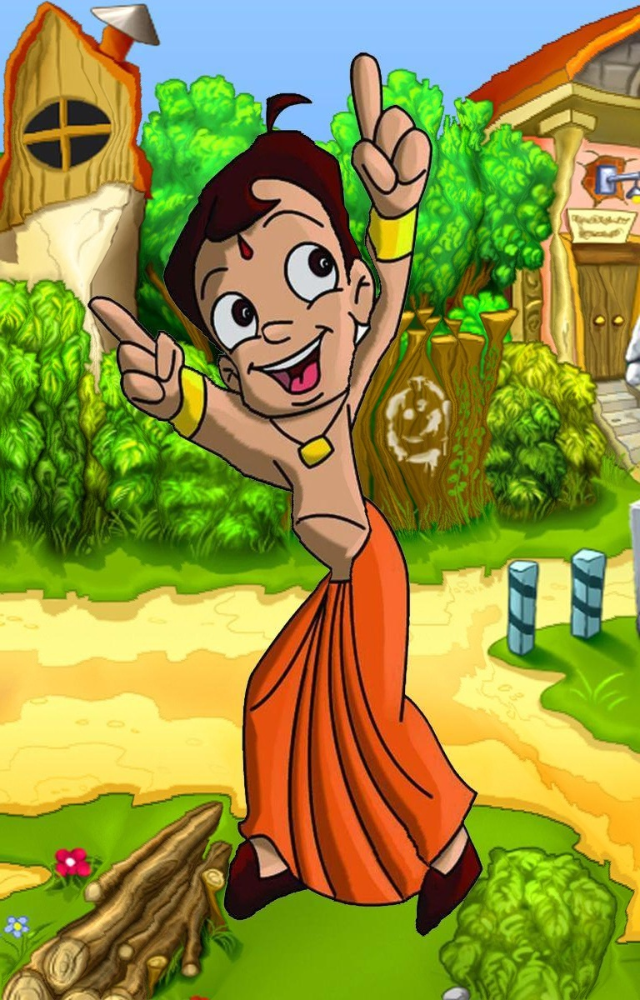

trafalgar-square 20% resized


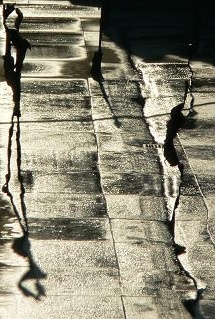

trafalgar-square 40% resized


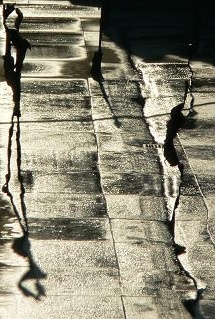

trafalgar-square 60% resized


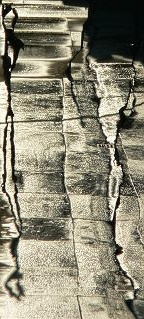

shadow 20% resized


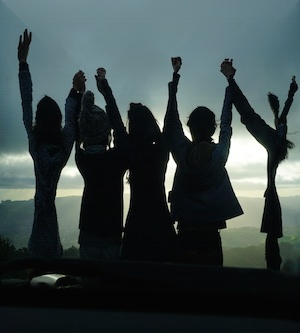

shadow 40% resized


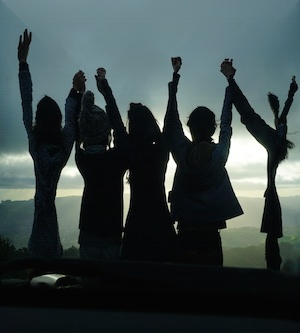

shadow 60% resized


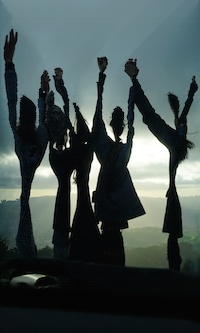

uluru 20% resized


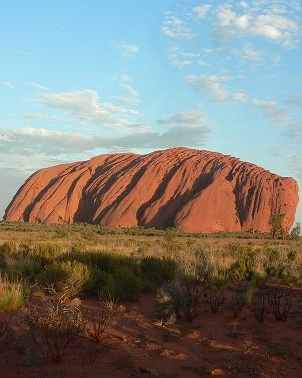

uluru 40% resized


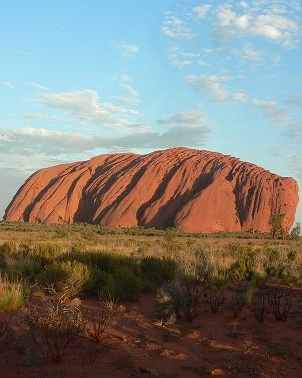

uluru 60% resized


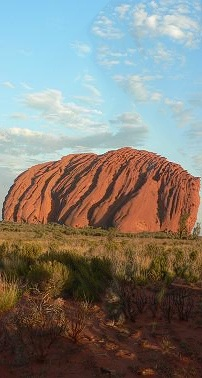

iiit 20% resized


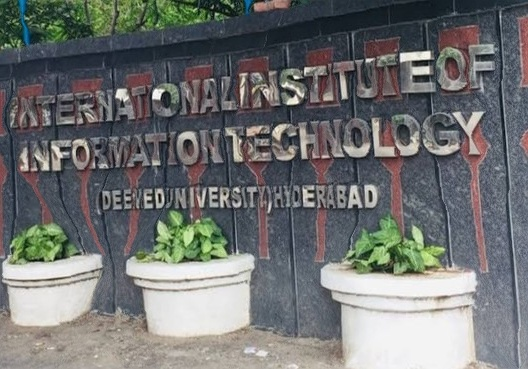

iiit 40% resized


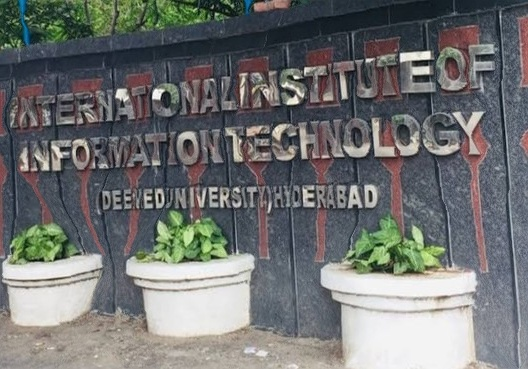

iiit 60% resized


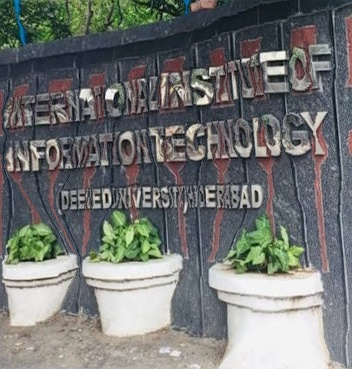

tanjore 20% resized


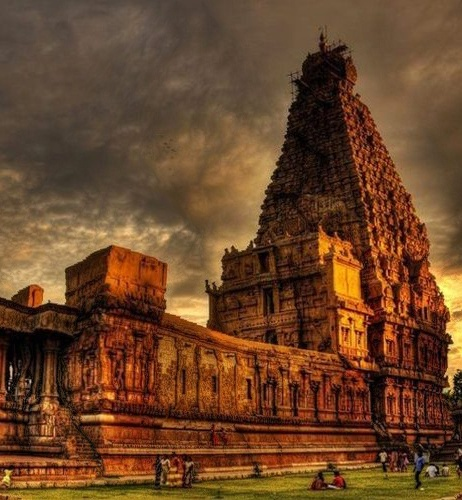

tanjore 40% resized


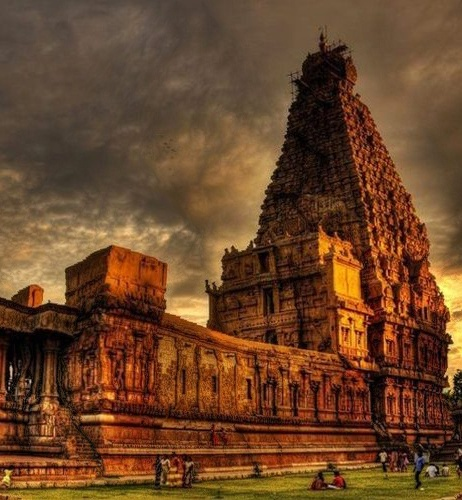

tanjore 60% resized


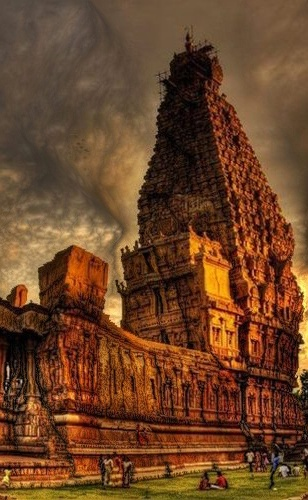

In [13]:
import matplotlib.pyplot  as plt
imgsNames = ["bangalore-dancers","cat","chhota-bheem","trafalgar-square","shadow","uluru","iiit","tanjore"]

for i in range(0,8):
  print(imgsNames[i],"20% resized")
  
  cv2_imshow(cv2.imread(imgsNames[i]+"_40%.jpg"))
  print(imgsNames[i],"40% resized")
  
  cv2_imshow(cv2.imread(imgsNames[i]+"_40%.jpg"))
  print(imgsNames[i],"60% resized")
  
  cv2_imshow(cv2.imread(imgsNames[i]+"_60%.jpg"))
  

### Vertical Seam removal for path.jpg

path.jpg 	  20 % removal time 4.574114349000013 	  

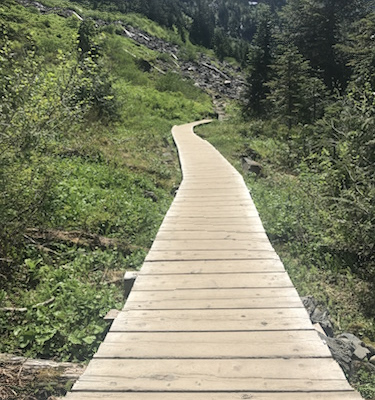

40 % removal time 5.966900049000003 	  

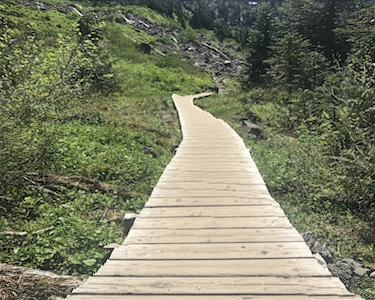

60 % removal time 7.807745240000031 	  

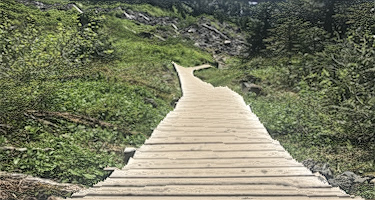

In [14]:
imag = cv2.imread("./images/path.jpg")
imag = np.array(imag,'int')
# print(imag.shape)
(h,w,d) = imag.shape
imag_T = cv2.transpose(imag)
# print(imag_T.shape)
print("path.jpg \t ",end=" ")
for i in range(1,4):
  start = timeit.default_timer()
  re_im = seam_carving(imag_T,round(0.2*i*imag_T.shape[1]))
  re_im = cv2.transpose(re_im)
  stop = timeit.default_timer()
  print(20*i , "% removal time" , stop -start,"\t ",end=" ")
  cv2_imshow(re_im)

## Question B
### Big-O analysis of seam_carving 

#### Time complexity of my solution
For seam_carving I wrote three functions 1) seam_energy 2) seam_identification 3) seam_removal

Function       $\quad\quad\quad\quad\quad$         Time complexity

seam_energy  $\quad\quad\quad\quad\quad$               O(h*w)

seam_identification$\quad\quad\quad$      O(h*w)

seam_removal$\quad\quad\quad\quad\quad$O(h*w)

Overall **Time complexity = $O(n*h*w)$** where h,w are height and width of an image, n is the number of seam removals

#### Naive solution time complexity

Let's say if we choose $i_{th}$ pixel from the 1st row, then we have 3 possible choices(i-1,i,i+1) to remove a pixel in the 2nd row and for each choice in the second row, we have again three possible choices in the third row. 

So, if we are at row j and for removing any pixel from $(j+1)_{th}$ row we have 3 possible choices. There are h rows and w columns. The number of possible vertical seams are upper bounded by **$3^h*w$**, where the w is added because we have w choices to choose a pixel in the first low.

Hence the time complexity for the naive solution = **$O(n*3^h*w)$**, where h,w are height and width of the given image,n is number of seam removals.

##Question C

#### 1)
The result of seam removal is still same even if the image is flipped upside down. Because the adjacent pixels of pixel won't change when we flip the image upside down. So, seam energy of a pixel won't change, seam identification still gives the same path as the minimum seam energy because all those pixels are still connected even after the image is flipped. 

The seam energy is defined  is to find the sum of distances between adjacent between the a pixel with its adjacent ones. When we flip an image, the pixel at down moves to up and viceversa. But the seam energy of that pixel is still same, because the adjacent pixels remains adjacent even after flipping upside down. 

Therefore, the overall energy of the image during seam energy is still same even after flipping upside down the image.

#### 2)
For resizing an image in both dimesions,it is always better to do seam identification for both horizontal and vertical and then remove the seam which gives minimum seam energy path from all the paths of horizontal and vertical. Because seam carving is content-aware resizing algorithm, it always tries to preserve as much as content possible even after resizing. Some, images have more content in horizontal way and some has more content in vertical way, so choosing one after another will not best possible resizing. Choosing the minimum seam energy path from both horizontal and vertical seams will  remove very less information after removing a seam. 